# Y1 Predict

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

import pickle
with open('raw_data_20181008.pickle', 'rb') as handle:
    raw_data = pickle.load(handle)
    
copy_keys = list(raw_data.keys())
for stock in copy_keys:
    if len(raw_data[stock].loc[:'2013-01-01']) < 1:
        del raw_data[stock]
        
# stock에서 Volume==0인 index, stock에서 제외
for key, df in raw_data.items():
    raw_data[key] = df.drop(df.index[np.where(df.Volume==0)[0]], axis=0)
    
# feature 생성
for key, df in raw_data.items():
    df["pct_change"] = df.Close.pct_change()
    for i in range(3, 31, 2):
        df["close_ma_{}".format(i)] = df.Close.rolling(window = i).mean()
        df["volume_ma_{}".format(i)] = df.Volume.rolling(window = i).mean()
    for i in [7, 21, 30, 60, 90, 91, 100, 120]:
        df["his_vol_{}".format(i)] = df["pct_change"].rolling(window = i).std()*(252**0.5)
    for i in [1, 3, 5, 7, 10, 12, 14]:
        df['returnsCC{}'.format(i) ]= np.log(df.Open / df.Close.shift(i))
        df['returnsOO{}'.format(i) ] = np.log(df.Open / df.Open.shift(i))
        df['returnsCC{}'.format(i) ]= np.log(df.Close / df.Close.shift(i))
        df['returnsOC{}'.format(i) ] = np.log(df.Close / df.Open.shift(i))
    for i in [1, 3, 5, 7, 10]:
        df['Y1_{}'.format(i)] = np.where(df.Close - df.Close.shift(1).rolling(i).mean()>=0,1,0)
        for shift in [1, 2, 3, 4, 5]:
            df['sh{}_Y1_{}'.format(shift, i)] = df['Y1_{}'.format(i)].shift(-1*shift)
            
data={}
validation_={}
for stock, df in raw_data.items():
    data[stock] = df.loc['2013-07-01':'2018-07-01']
    validation_[stock] = df.loc['2018-06-20':]
    
X = [i for i in data['삼성전자'].columns if i.find('sh') == -1]

%run moon_code

train, test = multi_train_test_split(data, 0.8, dtrain=True)

# Learning

In [3]:
alg = XGBClassifier(
 learning_rate =0.15,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=2,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic',
 nthread=4,
 scale_pos_weight=1,
 seed=27)

In [4]:
y_li = [i for i in data['삼성전자'].columns if i.find('sh') != -1]

In [6]:
print(y_li)

['sh1_Y1_1', 'sh2_Y1_1', 'sh3_Y1_1', 'sh4_Y1_1', 'sh5_Y1_1', 'sh1_Y1_3', 'sh2_Y1_3', 'sh3_Y1_3', 'sh4_Y1_3', 'sh5_Y1_3', 'sh1_Y1_5', 'sh2_Y1_5', 'sh3_Y1_5', 'sh4_Y1_5', 'sh5_Y1_5', 'sh1_Y1_7', 'sh2_Y1_7', 'sh3_Y1_7', 'sh4_Y1_7', 'sh5_Y1_7', 'sh1_Y1_10', 'sh2_Y1_10', 'sh3_Y1_10', 'sh4_Y1_10', 'sh5_Y1_10']


In [7]:
%run xgb_modelfit

In [8]:
import copy

def modelfit(alg, train, test, X, y):
    alg = copy.deepcopy(alg)
    xgb_params = alg.get_xgb_params()
    xgtrain = xgb.DMatrix(train[X].values, label=train[y].values)
    cvresult=xgb.cv(xgb_params, xgtrain,
                    num_boost_round=alg.get_params()['n_estimators'],
                    nfold=5, early_stopping_rounds=50,
                    show_stdv=False)
    alg.set_params(n_estimators=cvresult.shape[0])
    alg.fit(train[X], train[y], eval_metric='auc')
    dtrain_predictions = alg.predict(train[X])
    dtrain_predprob = alg.predict_proba(train[X])[:,1]
    dtest_predictions = alg.predict(test[X])
    dtest_predprob = alg.predict_proba(test[X])[:,1]
    print("Train Accuracy : {:.4f}".format(metrics.accuracy_score(
                            train[y].values, dtrain_predictions)))
    print("Train AUC Score : {:.4f}".format(metrics.roc_auc_score(
                            train[y].values, dtrain_predprob)))
    print("Test  Accuracy : {:.4f}".format(metrics.accuracy_score(
                            test[y].values, dtest_predictions)))
    print("Test  AUC Score : {:.4f}".format(metrics.roc_auc_score(
                            test[y].values, dtest_predprob)))
    return alg

In [11]:
model_set = {}
for y in y_li:
    print('\n{}'.format(y))
    model = modelfit(alg, 
                     train['삼성전자'], test['삼성전자'],
                     X, y)
    model_set[y] = model


sh1_Y1_1
Train Accuracy : 0.7818
Train AUC Score : 0.8801
Test  Accuracy : 0.5224
Test  AUC Score : 0.5432

sh2_Y1_1
Train Accuracy : 0.7756
Train AUC Score : 0.8684
Test  Accuracy : 0.4980
Test  AUC Score : 0.4664

sh3_Y1_1
Train Accuracy : 0.9805
Train AUC Score : 0.9989
Test  Accuracy : 0.5388
Test  AUC Score : 0.5243

sh4_Y1_1
Train Accuracy : 0.6004
Train AUC Score : 0.6616
Test  Accuracy : 0.4816
Test  AUC Score : 0.4954

sh5_Y1_1
Train Accuracy : 1.0000
Train AUC Score : 1.0000
Test  Accuracy : 0.5306
Test  AUC Score : 0.5331

sh1_Y1_3
Train Accuracy : 0.9662
Train AUC Score : 0.9964
Test  Accuracy : 0.6980
Test  AUC Score : 0.7624

sh2_Y1_3
Train Accuracy : 0.9918
Train AUC Score : 0.9994
Test  Accuracy : 0.5388
Test  AUC Score : 0.5450

sh3_Y1_3
Train Accuracy : 1.0000
Train AUC Score : 1.0000
Test  Accuracy : 0.5551
Test  AUC Score : 0.5392

sh4_Y1_3
Train Accuracy : 0.9016
Train AUC Score : 0.9708
Test  Accuracy : 0.5143
Test  AUC Score : 0.5120

sh5_Y1_3
Train Accuracy : 0

In [24]:
a = 1
for y, model in model_set.items():
    print(y, ' ', model.get_params()['n_estimators'])
    if a % 5 == 0:
        print('')
    a += 1

sh1_Y1_1   7
sh2_Y1_1   5
sh3_Y1_1   48
sh4_Y1_1   1
sh5_Y1_1   85

sh1_Y1_3   43
sh2_Y1_3   48
sh3_Y1_3   101
sh4_Y1_3   18
sh5_Y1_3   74

sh1_Y1_5   29
sh2_Y1_5   36
sh3_Y1_5   61
sh4_Y1_5   55
sh5_Y1_5   62

sh1_Y1_7   13
sh2_Y1_7   54
sh3_Y1_7   224
sh4_Y1_7   147
sh5_Y1_7   59

sh1_Y1_10   26
sh2_Y1_10   54
sh3_Y1_10   172
sh4_Y1_10   157
sh5_Y1_10   75



In [26]:
model_set = {}
for stock, df in train.items():
    print('\n',stock)
    model = modelfit(alg, df, test[stock], X, 'sh1_Y1_5')
    model_set[stock] = model


 AK홀딩스
Train Accuracy : 0.9632
Train AUC Score : 0.9950
Test  Accuracy : 0.7020
Test  AUC Score : 0.7876

 BNK금융지주
Train Accuracy : 0.9295
Train AUC Score : 0.9826
Test  Accuracy : 0.7551
Test  AUC Score : 0.8134

 CJ
Train Accuracy : 0.9224
Train AUC Score : 0.9772
Test  Accuracy : 0.7714
Test  AUC Score : 0.8382

 CJ CGV
Train Accuracy : 0.8529
Train AUC Score : 0.9340
Test  Accuracy : 0.7429
Test  AUC Score : 0.8115

 CJ대한통운
Train Accuracy : 0.9867
Train AUC Score : 0.9994
Test  Accuracy : 0.6857
Test  AUC Score : 0.7681

 CJ제일제당
Train Accuracy : 0.8652
Train AUC Score : 0.9488
Test  Accuracy : 0.7469
Test  AUC Score : 0.8144

 DB손해보험
Train Accuracy : 0.8999
Train AUC Score : 0.9726
Test  Accuracy : 0.7429
Test  AUC Score : 0.7934

 DB하이텍
Train Accuracy : 0.8345
Train AUC Score : 0.8991
Test  Accuracy : 0.7265
Test  AUC Score : 0.8142

 GKL
Train Accuracy : 0.8907
Train AUC Score : 0.9710
Test  Accuracy : 0.7265
Test  AUC Score : 0.7956

 GS
Train Accuracy : 0.8846
Train AUC Score 

Train Accuracy : 0.9928
Train AUC Score : 0.9991
Test  Accuracy : 0.6901
Test  AUC Score : 0.7934

 롯데정밀화학
Train Accuracy : 0.9070
Train AUC Score : 0.9750
Test  Accuracy : 0.7020
Test  AUC Score : 0.7707

 롯데지주
Train Accuracy : 0.9477
Train AUC Score : 0.9874
Test  Accuracy : 0.7167
Test  AUC Score : 0.8114

 롯데칠성
Train Accuracy : 0.9669
Train AUC Score : 0.9946
Test  Accuracy : 0.6694
Test  AUC Score : 0.7316

 롯데케미칼
Train Accuracy : 0.9888
Train AUC Score : 0.9994
Test  Accuracy : 0.6531
Test  AUC Score : 0.7251

 롯데푸드
Train Accuracy : 0.9286
Train AUC Score : 0.9840
Test  Accuracy : 0.7479
Test  AUC Score : 0.8087

 롯데하이마트
Train Accuracy : 0.8580
Train AUC Score : 0.9401
Test  Accuracy : 0.6816
Test  AUC Score : 0.7548

 메리츠종금증권
Train Accuracy : 0.9081
Train AUC Score : 0.9784
Test  Accuracy : 0.7429
Test  AUC Score : 0.8178

 무학
Train Accuracy : 0.8836
Train AUC Score : 0.9547
Test  Accuracy : 0.7061
Test  AUC Score : 0.8034

 미래에셋대우
Train Accuracy : 0.8570
Train AUC Score : 0.916

Train Accuracy : 0.8454
Train AUC Score : 0.9356
Test  Accuracy : 0.7061
Test  AUC Score : 0.7763

 한전KPS
Train Accuracy : 0.9551
Train AUC Score : 0.9926
Test  Accuracy : 0.7224
Test  AUC Score : 0.8069

 한전기술
Train Accuracy : 0.9142
Train AUC Score : 0.9768
Test  Accuracy : 0.7592
Test  AUC Score : 0.8553

 한진중공업
Train Accuracy : 0.8590
Train AUC Score : 0.9223
Test  Accuracy : 0.7265
Test  AUC Score : 0.8110

 한화
Train Accuracy : 0.9969
Train AUC Score : 0.9999
Test  Accuracy : 0.7306
Test  AUC Score : 0.7967

 한화생명
Train Accuracy : 0.9224
Train AUC Score : 0.9818
Test  Accuracy : 0.7224
Test  AUC Score : 0.8026

 한화에어로스페이스
Train Accuracy : 0.9305
Train AUC Score : 0.9837
Test  Accuracy : 0.7796
Test  AUC Score : 0.8557

 한화케미칼
Train Accuracy : 0.8662
Train AUC Score : 0.9510
Test  Accuracy : 0.7143
Test  AUC Score : 0.7744

 현대건설
Train Accuracy : 0.8662
Train AUC Score : 0.9470
Test  Accuracy : 0.7878
Test  AUC Score : 0.8509

 현대그린푸드
Train Accuracy : 0.9101
Train AUC Score : 0.970

In [27]:
for stock, model in model_set.items():
    print(stock, ' ', model.get_params()['n_estimators'])

AK홀딩스   46
BNK금융지주   34
CJ   23
CJ CGV   7
CJ대한통운   60
CJ제일제당   10
DB손해보험   26
DB하이텍   4
GKL   24
GS   15
GS건설   27
GS리테일   3
HDC   28
JW중외제약   7
JW홀딩스   7
KB금융   16
KCC   7
KT   31
KT&G   7
LF   13
LG   53
LG디스플레이   39
LG상사   32
LG생활건강   11
LG유플러스   6
LG이노텍   11
LG전자   3
LG하우시스   20
LG화학   14
LS   20
LS산전   43
NAVER   83
NH투자증권   25
OCI   8
POSCO   7
S&T모티브   9
S-Oil   123
SBS   33
SK   9
SKC   16
SK네트웍스   16
SK디스커버리   10
SK이노베이션   21
SK텔레콤   51
SK하이닉스   29
SPC삼립   32
강원랜드   9
고려아연   30
고려제강   6
금호석유   5
금호타이어   9
기아차   19
기업은행   6
남양유업   88
남해화학   31
넥센타이어   11
녹십자   59
녹십자홀딩스   50
농심   6
대교   12
대덕전자   16
대림산업   10
대상   46
대우건설   12
대우조선해양   24
대웅제약   108
대한유화   5
대한항공   11
동국제강   35
동서   10
동아쏘시오홀딩스   15
동양   17
동원F&B   46
동원시스템즈   17
두산   9
두산인프라코어   45
두산중공업   5
락앤락   22
롯데쇼핑   60
롯데정밀화학   25
롯데지주   31
롯데칠성   41
롯데케미칼   57
롯데푸드   28
롯데하이마트   10
메리츠종금증권   25
무학   11
미래에셋대우   5
보령제약   23
부광약품   18
빙그레   20
삼성SDI   33
삼성생명   75
삼성엔지니어링   18
삼성전기   16
삼성전자   29
삼성중공업   20
삼성증권   14
삼

In [28]:
pred = pd.DataFrame()
for stock, model in model_set.items():
    a = model.predict(validation_[stock][X])
    a = pd.DataFrame(a, index = validation_[stock].index, columns=['{}'.format(stock)])
    pred = pd.concat((pred, a), axis=1)
    pred = pred.fillna(0)
col = pd.MultiIndex.from_product([['pred'],pred.columns])
pred.columns = col

In [29]:
pred

pred                                                           \
           AK홀딩스 BNK금융지주   CJ CJ CGV CJ대한통운 CJ제일제당 DB손해보험 DB하이텍  GKL   GS   
Date                                                                        
2018-06-20   0.0     0.0  0.0    0.0    1.0    0.0    1.0   0.0  0.0  0.0   
2018-06-21   1.0     0.0  0.0    0.0    1.0    0.0    0.0   0.0  0.0  0.0   
2018-06-22   0.0     0.0  0.0    1.0    1.0    0.0    0.0   1.0  1.0  0.0   
2018-06-25   0.0     0.0  1.0    1.0    1.0    1.0    0.0   1.0  1.0  1.0   
2018-06-26   0.0     1.0  0.0    1.0    0.0    1.0    0.0   1.0  1.0  1.0   
2018-06-27   0.0     0.0  0.0    1.0    0.0    0.0    0.0   1.0  0.0  0.0   
2018-06-28   1.0     0.0  0.0    0.0    0.0    1.0    0.0   0.0  0.0  0.0   
2018-06-29   1.0     1.0  1.0    0.0    1.0    1.0    1.0   0.0  1.0  0.0   
2018-07-02   0.0     0.0  1.0    0.0    0.0    0.0    0.0   0.0  0.0  0.0   
2018-07-03   0.0     0.0  0.0    1.0    1.0    0.0    1.0   0.0  0.0  0.0   
2018-07-04   0.0     0.0  0.0    0.0    1.0    0.0    1.0   0.0  0.0  0.0   
2018-07-05   1.0     0.0  0.0    0.0    1.0    0.0    1.0   0.0  0.0  0.0   
2018-07-06   1.0     1.0  1.0    0.0    1.0    0.0    1.0   0.0  0.0  1.0   
2018-07-09   1.0     1.0  1.0    1.0    1.0    1.0    1.0   1.0  0.0  0.0   
2018-07-10   1.0     1.0  1.0    1.0    1.0    1.0    1.0   0.0  0.0  0.0   
2018-07-11   1.0     0.0  1.0    1.0    1.0    1.0    1.0   0.0  1.0  1.0   
2018-07-12   1.0     0.0  0.0    0.0    0.0    0.0    0.0   0.0  1.0  0.0   
2018-07-13   1.0     0.0  1.0    0.0    0.0    1.0    0.0   0.0  0.0  1.0   
2018-07-16   1.0     0.0  1.0    0.0    0.0    0.0    0.0   1.0  0.0  1.0   
2018-07-17   1.0     0.0  1.0    0.0    0.0    0.0    0.0   1.0  0.0  0.0   
2018-07-18   1.0     0.0  0.0    0.0    0.0    0.0    0.0   0.0  0.0  1.0   
2018-07-19   0.0     0.0  0.0    0.0    0.0    0.0    0.0   0.0  0.0  1.0   
2018-07-20   0.0     0.0  0.0    0.0    1.0    0.0    1.0   0.0  0.0  0.0   
2018-07-23   0.0     0.0  0.0    0.0    0.0    0.0    1.0   0.0  1.0  1.0   
2018-07-24   1.0     1.0  0.0    0.0    0.0    1.0    1.0   0.0  1.0  1.0   
2018-07-25   1.0     1.0  0.0    0.0    0.0    1.0    1.0   0.0  0.0  1.0   
2018-07-26   1.0     1.0  0.0    0.0    0.0    1.0    0.0   0.0  1.0  1.0   
2018-07-27   1.0     0.0  0.0    0.0    1.0    1.0    0.0   1.0  0.0  1.0   
2018-07-30   0.0     0.0  0.0    1.0    0.0    1.0    1.0   0.0  1.0  1.0   
2018-07-31   1.0     1.0  1.0    1.0    0.0    1.0    1.0   0.0  1.0  1.0   
...          ...     ...  ...    ...    ...    ...    ...   ...  ...  ...   
2018-08-16   0.0     0.0  0.0    0.0    0.0    0.0    1.0   1.0  1.0  1.0   
2018-08-17   0.0     0.0  0.0    0.0    0.0    0.0    1.0   1.0  1.0  1.0   
2018-08-20   0.0     1.0  0.0    0.0    1.0    0.0    1.0   0.0  1.0  1.0   
2018-08-21   0.0     0.0  1.0    0.0    1.0    0.0    0.0   1.0  0.0  1.0   
2018-08-22   0.0     1.0  1.0    1.0    1.0    0.0    0.0   1.0  0.0  1.0   
2018-08-23   0.0     0.0  0.0    1.0    1.0    1.0    0.0   1.0  0.0  0.0   
2018-08-24   0.0     0.0  0.0    1.0    1.0    1.0    0.0   1.0  0.0  0.0   
2018-08-27   0.0     0.0  1.0    1.0    1.0    1.0    0.0   0.0  0.0  1.0   
2018-08-28   0.0     1.0  1.0    1.0    0.0    1.0    0.0   1.0  0.0  1.0   
2018-08-29   0.0     1.0  1.0    1.0    1.0    1.0    0.0   1.0  0.0  1.0   
2018-08-30   0.0     0.0  0.0    0.0    1.0    0.0    0.0   1.0  0.0  0.0   
2018-08-31   1.0     1.0  0.0    0.0    1.0    0.0    1.0   1.0  0.0  0.0   
2018-09-03   0.0     1.0  1.0    0.0    1.0    1.0    0.0   0.0  0.0  0.0   
2018-09-04   0.0     0.0  1.0    0.0    0.0    0.0    1.0   0.0  0.0  0.0   
2018-09-05   0.0     1.0  1.0    0.0    0.0    0.0    0.0   0.0  0.0  0.0   
2018-09-06   0.0     0.0  1.0    0.0    1.0    0.0    1.0   0.0  0.0  0.0   
2018-09-07   0.0     1.0  1.0    0.0    1.0    0.0    1.0   0.0  0.0  1.0   
2018-09-10   0.0     1.0  1.0    0.0    1.0    1.0    0.0   0.0  0.0  1.0   
2018-09-

In [32]:
train['삼성전자'].groupby('Y1_5').agg(np.mean)

,Open,High,Low,Close,Adj Close,Volume,pct_change,close_ma_3,volume_ma_3,close_ma_5,...,sh2_Y1_7,sh3_Y1_7,sh4_Y1_7,sh5_Y1_7,Y1_10,sh1_Y1_10,sh2_Y1_10,sh3_Y1_10,sh4_Y1_10,sh5_Y1_10
Y1_5,,,,,,,,,,,,,,,,,,,,,
0,27928.430108,28136.301075,27603.956989,27778.924731,1324.664986,1.232411e+07,-0.007663,27987.942652,1.224524e+07,28127.776344,...,0.326882,0.412903,0.462366,0.509677,0.182796,0.275269,0.333333,0.382796,0.415054,0.451613
1,29272.015656,29612.876712,29064.266145,29429.275930,1849.393112,1.190770e+07,0.008293,29201.082844,1.199752e+07,29035.264188,...,0.696673,0.620352,0.575342,0.534247,0.868885,0.786693,0.733855,0.690802,0.661448,0.630137


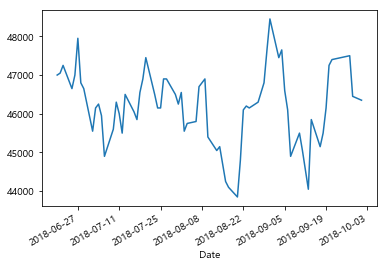

In [35]:
validation_['삼성전자'].Close.plot()

In [43]:
def get_col_df(df_name, fillna=None):
    df = pd.DataFrame()
    for stock in model_set.keys():
        df = pd.concat((df,validation_[stock][df_name]), axis=1)
    df.columns = list(model_set.keys())
    if fillna == 'mean':
        df = df.fillna(df.mean())
    else:
        df = df.fillna(0)
    col = pd.MultiIndex.from_product([['{}'.format(df_name)],df.columns])
    df.columns = col
    return df

In [45]:
res = pd.concat((pred, get_col_df('Close', 'mean')), axis=1)

In [91]:
df = pd.DataFrame()
for stock in model_set.keys():
    df = pd.concat((df,validation_[stock]['Close']\
                   -validation_[stock]['Close'].shift(1).rolling(5).mean()
                   ), axis=1)
df.columns = list(model_set.keys())
# df = df.fillna(df.mean())
col = pd.MultiIndex.from_product([['{}'.format('Y1')],df.columns])
df.columns = col

In [92]:
avg = pd.DataFrame()
for stock in model_set.keys():
    a = pd.concat((
        validation_[stock].groupby('Y1_5').get_group(0).rolling(5).mean()['Close'],
        validation_[stock].groupby('Y1_5').get_group(1).rolling(5).mean()['Close']),
        axis=0)
    avg = pd.concat((avg, a), axis=1)
avg.columns = list(model_set.keys())
col = pd.MultiIndex.from_product([['{}'.format('avg')],avg.columns])
avg.Columns = avg

In [110]:
projection = pd.DataFrame(df.values + avg.values, columns = avg.columns, index = avg.index)

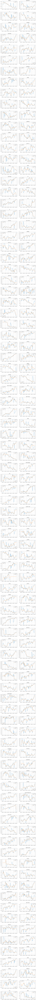

In [111]:
plt.figure(figsize=(15,450))
for idx, stock in enumerate(projection.keys()):
    plt.subplot2grid((91,2), (idx//2, idx%2))
    plt.plot(projection.loc['2018-07-20':][stock], label='projection')
    plt.plot(res['Close'].loc['2018-07-20':][stock], label='real')
    plt.title(stock, fontsize=15)
    plt.grid(True)
    plt.legend(fancybox=True, shadow=True)
plt.subplots_adjust(hspace=0.4)
plt.show()

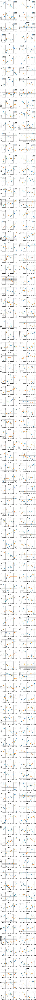

In [109]:
plt.figure(figsize=(15,450))
for idx, stock in enumerate(projection.keys()):
    plt.subplot2grid((91,2), (idx//2, idx%2))
    plt.plot(projection.loc['2018-07-20':][stock], label='projection')
    plt.plot(res['Close'].loc['2018-07-20':][stock], label='real')
    plt.title(stock, fontsize=15)
    plt.grid(True)
    plt.legend(fancybox=True, shadow=True)
plt.subplots_adjust(hspace=0.4)
plt.show()